<a href="https://colab.research.google.com/github/oliviaqu/COM576/blob/main/COMP576.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the necessary packages

In [ ]:
!pip install jupyterthemes
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import random
from random import sample
import os
import PIL

In [ ]:
# Check folders
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive',force_remount=False)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
!unzip '/content/drive/Shareddrives/576/seg_test.zip' -d'/content/seg_test1' 

In [ ]:
!unzip '/content/drive/Shareddrives/576/seg_train.zip' -d'/content/seg_train1' 

In [ ]:
#Check the number of images in training, validation and test dataset
# Create empty list
train = []
test = []

# os.listdir returns the list of files in the folder, in this case image class names
for i in os.listdir('seg_train'):
  train_class = os.listdir(os.path.join('seg_train', i))
  train.extend(train_class)
  test_class = os.listdir(os.path.join('seg_test', i))
  test.extend(test_class)

# Show the number of train and test images
print('Number of the train images: {}\nNumber of test images: {}'.format(len(train), len(test)))

Number of the train images: 14034
Number of test images: 3000


# Task 3 Data exploration and visulization

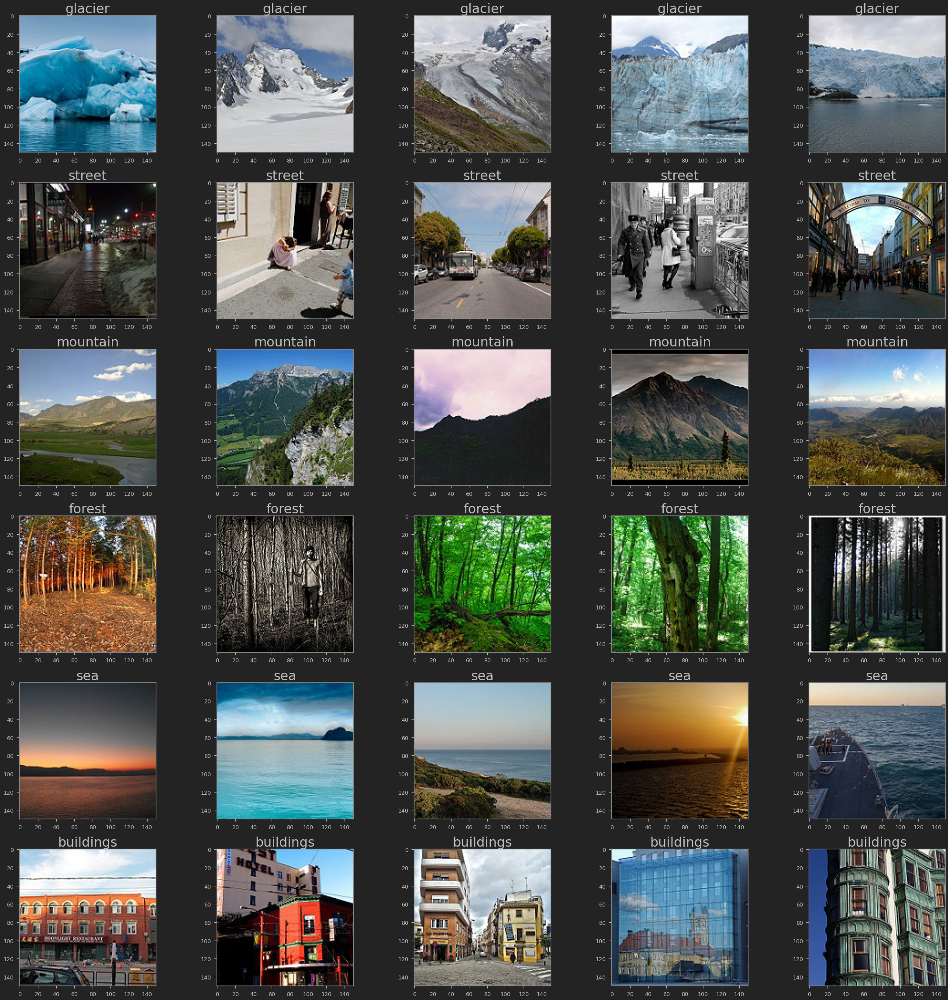

In [ ]:
# Visualize the images in the train dataset
fig, axs = plt.subplots(6,5, figsize=(32,32))

# Define count
count = 0

# Create function
for i in os.listdir('seg_train'):
    
  # Get the list of images in the particular class
  train_class = os.listdir(os.path.join('seg_train',i))
    
  # Plot 5 images per class
  for j in range(5):
        img = os.path.join('seg_train', i, train_class[j])
        img = PIL.Image.open(img)
        axs[count][j].imshow(img)
        axs[count][j].set_title(i, fontsize = 30)

  count+=1 
    
fig.tight_layout()

In [ ]:
# Create empty list for train dataset
No_images_per_class = []
Class_name = []

# Check the number of images in each class in the training dataset
for i in os.listdir('./seg_train'):
  train_class = os.listdir(os.path.join('seg_train', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in glacier = 2404 

Number of images in street = 2382 

Number of images in mountain = 2512 

Number of images in forest = 2271 

Number of images in sea = 2274 

Number of images in buildings = 2191 



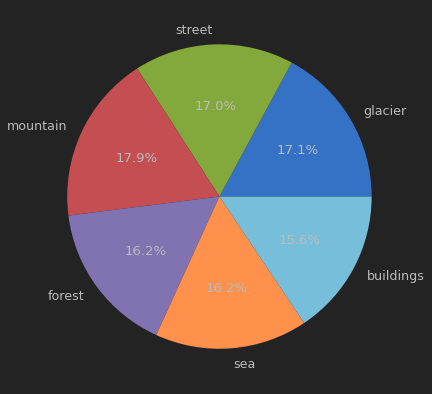

In [ ]:
# Plot pie chart for train dataset
fig1, ax1 = plt.subplots()
ax1.pie(No_images_per_class, labels = Class_name, autopct = '%1.1f%%')
plt.show()

# Task 4 Data Augmentation

In [ ]:
#os.remove('seg_test/glacier/._20541.jpg')
os.remove('seg_test/glacier/20303.jpg')

In [ ]:
os.remove('seg_test/glacier/22670.jpg')

In [ ]:
#os.remove('seg_test/glacier/._23260.jpg')
os.remove('seg_test/glacier/21336.jpg')

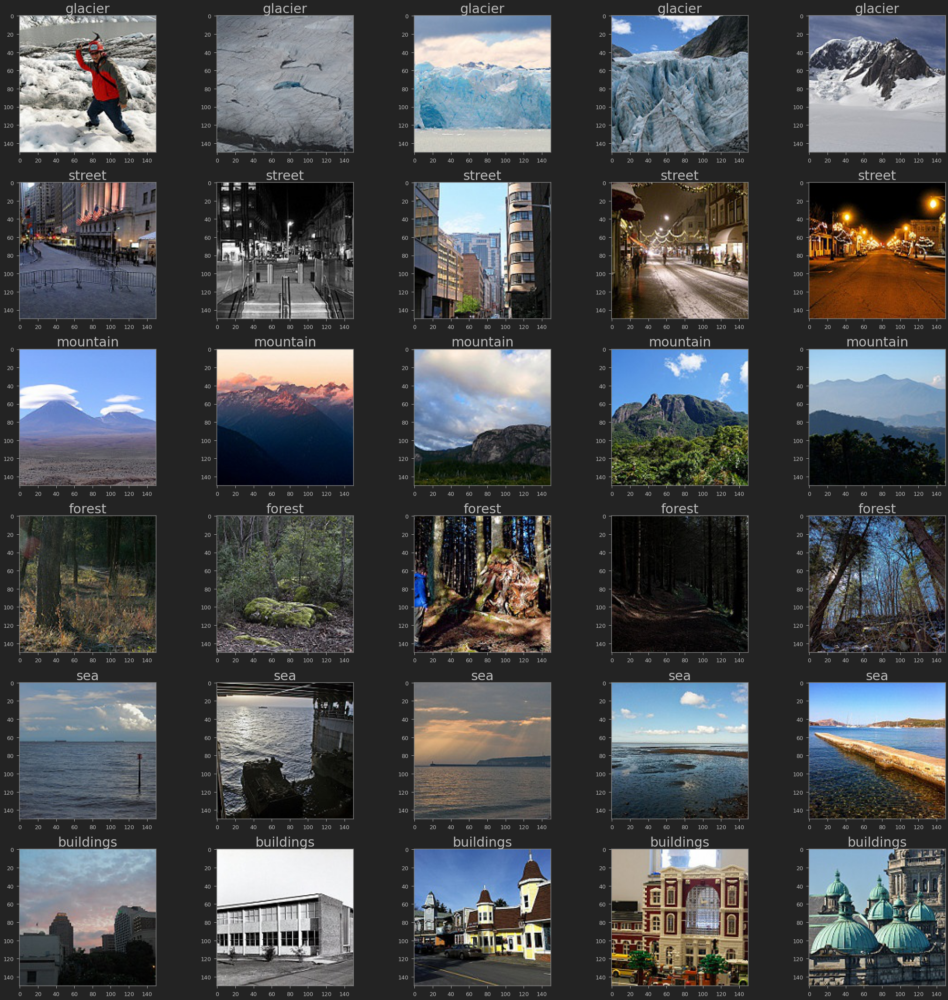

In [ ]:
# Visualize the images in the test dataset
fig, axs = plt.subplots(6,5, figsize=(32,32))

# Define count
count = 0

# Create function
for i in os.listdir('./seg_test'):
    
  # Get the list of images in the particular class
  train_class = os.listdir(os.path.join('seg_test',i))
    
  # Plot 5 images per class
  for j in range(5):
        img = os.path.join('seg_test', i, train_class[j])
        img = PIL.Image.open(img)
        axs[count][j].imshow(img)
        axs[count][j].set_title(i, fontsize = 30)

  count+=1 
    
fig.tight_layout()


In [ ]:
# Create run-time augmentation on training and test dataset
# For training datagenerator, we add normalization, shear angle, zooming range and horizontal flip
train_datagen = ImageDataGenerator(
                rescale = 1./255,
                zoom_range = 0.2,
                validation_split = 0.15,
                horizontal_flip = True)

# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Creating datagenerator for training, validation and test dataset.

train_generator = train_datagen.flow_from_directory(
        'seg_train',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='training')

validation_generator = train_datagen.flow_from_directory(
        'seg_train',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='validation')

test_generator = test_datagen.flow_from_directory(
        'seg_test',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')

Found 11932 images belonging to 6 classes.
Found 2102 images belonging to 6 classes.
Found 2997 images belonging to 6 classes.


In [ ]:
## Task 4 data-augenmatation Challenge 
train_datagen2 = ImageDataGenerator(
                rescale = 1./255,
                zoom_range = 0.2,
                validation_split = 0.15,
                horizontal_flip = True,
                vertical_flip=True,
                brightness_range=None)

# For test datagenerator, we only normalize the data.
test_datagen2 = ImageDataGenerator(rescale=1./255)
train_generator2 = train_datagen2.flow_from_directory(
        'seg_train',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='training')

validation_generator2 = train_datagen2.flow_from_directory(
        'seg_train',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='validation')

test_generator2 = test_datagen2.flow_from_directory(
        'seg_test',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')


Found 11932 images belonging to 6 classes.
Found 2102 images belonging to 6 classes.
Found 2997 images belonging to 6 classes.


# Task 5 Theory and Intuition Behind CNN and RESIDUAL Model

# Task 6 Build RESNET Model

In [ ]:
# This function implements a resnet block.
# You can use a different architecture if you like.
def res_block(X, filter, stage):
  
    # Convolutional_block
    X_copy = X

    f1 , f2, f3 = filter
    
    # Main Path
    X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_conv_a', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = MaxPool2D((2,2))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_conv_b', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_c', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_c')(X)


    # Short path
    X_copy = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_copy', kernel_initializer= glorot_uniform(seed = 0))(X_copy)
    X_copy = MaxPool2D((2,2))(X_copy)
    X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy')(X_copy)

    # ADD
    X = Add()([X, X_copy])
    X = Activation('relu')(X)

    # Identity Block 1
    X_copy = X
    

    # Main Path
    X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis = 3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

    # ADD
    X = Add()([X, X_copy])
    X = Activation('relu')(X)

    # Identity Block 2
    X_copy = X


    # Main Path
    X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= glorot_uniform(seed = 0))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

    # ADD
    X = Add()([X, X_copy])
    X = Activation('relu')(X)

    return X

In [ ]:
# Based on the defined resnet block, construct the neural network.

input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Zero-padding
X = ZeroPadding2D((3,3))(X_input)

# 1- stage
X = Conv2D(64, (7,7), strides= (2,2), name = 'conv1', kernel_initializer= glorot_uniform(seed = 0))(X)
X = BatchNormalization(axis =3, name = 'bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides= (2,2))(X)

# 2- stage
X = res_block(X, filter= [64,64,256], stage= 2)

# 3- stage
X = res_block(X, filter= [128,128,512], stage= 3)

# 4- stage
X = res_block(X, filter= [256,256,1024], stage= 4)

# 5- stage
X = res_block(X, filter= [512,512,2048], stage= 5)

# Average Pooling
X = AveragePooling2D((2,2), name = 'Averagea_Pooling')(X)

# Final layer
X = Flatten()(X)
X = Dropout(0.4)(X)
X = Dense(6, activation = 'softmax', name = 'Dense_final', kernel_initializer= glorot_uniform(seed=0))(X)

# Build model.
model = Model(
    inputs= X_input, 
    outputs = X, 
    name = 'Resnet18'
)

# Check out model summary.
model.summary()

Model: "Resnet18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  9472        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                           

# Task 7 Compile and Train Deep Neutral Network Model

In [ ]:
# Compile the model
model.compile(
    optimizer = "adam", 
    loss = "categorical_crossentropy", 
    metrics = ["accuracy"]
)

In [ ]:
# Use early stopping to exit training if there is no improvement even after certain epochs (patience)
earlystopping = EarlyStopping(
    monitor = 'loss', 
    mode = 'min', 
    verbose = 1, 
    patience = 15
)

# Save the best model with lower validation loss
checkpointer = ModelCheckpoint(
    filepath = "weights.hdf5", 
    verbose = 1, 
    save_best_only = True
)

In [ ]:
###### this takes 50 mins to run ##########
# Finally, fit the neural network model to the data.
# Here we use 1 epoch for demonstration.
history = model.fit_generator(
    train_generator, 
    steps_per_epoch = train_generator.n // 32, 
    epochs = 1, 
    callbacks = [
        checkpointer, 
        earlystopping
    ]
)

<ipython-input-21-b6d67b1a75f3>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


191/372 [==============>...............] - ETA: 29:29 - loss: 1.4930 - accuracy: 0.5011

# Task 8 Assess Trained Model Performance

In [ ]:
model.load_weights('weights.hdf5')

In [ ]:
evaluate = model.evaluate_generator(
    test_generator, 
    steps = test_generator.n // 32, 
    verbose = 1
)

<ipython-input-25-eb6bbbda52d1>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  evaluate = model.evaluate_generator(


93/93 [==============================] - 131s 1s/step - loss: 0.3725 - accuracy: 0.8653


In [ ]:
# Assign label names to the corresponding indexes
labels = {
    0: 'buildings', 
    1: 'forest', 
    2: 'glacier', 
    3: 'mountain', 
    4: 'sea', 
    5: 'street'
}

In [ ]:
# Load images and their predictions 

prediction = []
original = []
image = []
count = 0
for i in os.listdir('seg_test'):
    for item in os.listdir(os.path.join('seg_test', i)):
        # code to open the image
        img= PIL.Image.open(os.path.join('seg_test', i, item))
        # resizing the image to (256,256)
        img = img.resize((256, 256))
        # appending image to the image list
        image.append(img)
        # converting image to array
        img = np.asarray(img, dtype = np.float32)
        # normalizing the image
        img = img / 255
        # reshaping the image into a 4D array
        img = img.reshape(-1, 256, 256, 3)
        # making prediction of the model
        predict = model.predict(img)
        # getting the index corresponding to the highest value in the prediction
        predict = np.argmax(predict)
        # appending the predicted class to the list
        prediction.append(labels[predict])
        # appending original class to the list
        original.append(i)

In [ ]:
# Get the test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.8618618618618619


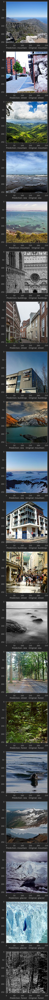

In [ ]:
# Visualize the results at random
fig = plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0, len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
    
fig.tight_layout()
plt.show()

In [ ]:
# Check out the Classification Report 
print(classification_report(np.asarray(prediction), np.asarray(original)))

# Based on these values, you can try t improve your model.
# For the sake of simplicity, hyperparameter tuning and model improvement was not done.

              precision    recall  f1-score   support

   buildings       0.91      0.84      0.87       475
      forest       0.97      0.95      0.96       480
     glacier       0.68      0.88      0.77       426
    mountain       0.93      0.72      0.81       679
         sea       0.87      0.92      0.90       483
      street       0.84      0.93      0.88       454

    accuracy                           0.86      2997
   macro avg       0.87      0.87      0.86      2997
weighted avg       0.87      0.86      0.86      2997



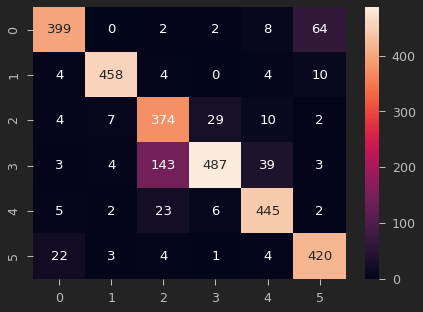

In [ ]:
# View the 6x6 confusion matrix
plt.figure(figsize = (7, 5))
cm = confusion_matrix(np.asarray(prediction), np.asarray(original))
sns.heatmap(
    cm, 
    annot = True, 
    fmt = "d"
)
plt.show()

# Task 9 Understand intuition of GradCam

# Task 10 Visualize Activiation Maps Through GradCam

In [ ]:
def grad_cam(img):
    # Convert the image to array of type float32
    img = np.asarray(img, dtype = np.float32)

    # Reshape the image from (256,256,3) to (1,256,256,3)
    img = img.reshape(-1, 256, 256, 3)
    img_scaled = img / 255

    # Name of the average pooling layer and dense final (you can see these names in the model summary)
    classification_layers = ["Averagea_Pooling", "Dense_final"]

    # Last convolutional layer in the model
    final_conv = model.get_layer("res_5_identity_2_c")

    # Create a model with original model inputs and the last conv_layer as the output
    final_conv_model = keras.Model(model.inputs, final_conv.output)

    # Then we create the input for classification layer, which is the output of last conv layer
    # In our case, output produced by the conv layer is of the shape (1,3,3,2048) 
    # Since the classification input needs the features as input, we ignore the batch dimension

    classification_input = keras.Input(shape = final_conv.output.shape[1:])

    # We iterate through the classification layers, to get the final layer and then append 
    # the layer as the output layer to the classification model.
    temp = classification_input
    for layer in classification_layers:
        temp = model.get_layer(layer)(temp)
    
    classification_model = keras.Model(classification_input, temp)


    # We use gradient tape to monitor the 'final_conv_output' to retrive the gradients
    # corresponding to the predicted class
    with tf.GradientTape() as tape:
        # Pass the image through the base model and get the feature map 
        final_conv_output = final_conv_model(img_scaled)

        # Assign gradient tape to monitor the conv_output
        tape.watch(final_conv_output)
      
        # Pass the feature map through the classification model and use argmax to get the 
        # index of the predicted class and then use the index to get the value produced by final
        # layer for that class
        prediction = classification_model(final_conv_output)

        predicted_class = tf.argmax(prediction[0][0][0])

        predicted_class_value = prediction[:,:,:,predicted_class]
  
    # Get the gradient corresponding to the predicted class based on feature map.
    # which is of shape (1,3,3,2048)
    gradient = tape.gradient(predicted_class_value, final_conv_output)

    # Since we need the filter values (2048), we reduce the other dimensions, 
    # which would result in a shape of (2048,)
    gradient_channels = tf.reduce_mean(gradient, axis=(0, 1, 2))

    # We then convert the feature map produced by last conv layer(1,6,6,1536) to (6,6,1536)
    final_conv_output = final_conv_output.numpy()[0]

    gradient_channels = gradient_channels.numpy()

    # We multiply the filters in the feature map produced by final conv layer by the 
    # filter values that are used to get the predicted class. By doing this we inrease the
    # value of areas that helped in making the prediction and lower the vlaue of areas, that 
    # did not contribute towards the final prediction
    for i in range(gradient_channels.shape[-1]):
        final_conv_output[:, :, i] *= gradient_channels[i]

    # We take the mean accross the channels to get the feature map
    heatmap = np.mean(final_conv_output, axis=-1)

    # Normalizing the heat map between 0 and 1, to visualize it
    heatmap_normalized = np.maximum(heatmap, 0) / np.max(heatmap)

    # Rescaling and converting the type to int
    heatmap = np.uint8(255 * heatmap_normalized )

    # Create the colormap
    color_map = plt.cm.get_cmap('jet')

    # get only the rb features from the heatmap
    color_map = color_map(np.arange(256))[:, :3]
    heatmap = color_map[heatmap]

    # convert the array to image, resize the image and then convert to array
    heatmap = keras.preprocessing.image.array_to_img(heatmap)
    heatmap = heatmap.resize((256, 256))
    heatmap = np.asarray(heatmap, dtype = np.float32)

    # Add the heatmap on top of the original image
    final_img = heatmap * 0.4 + img[0]
    final_img = keras.preprocessing.image.array_to_img(final_img)

    return final_img, heatmap_normalized

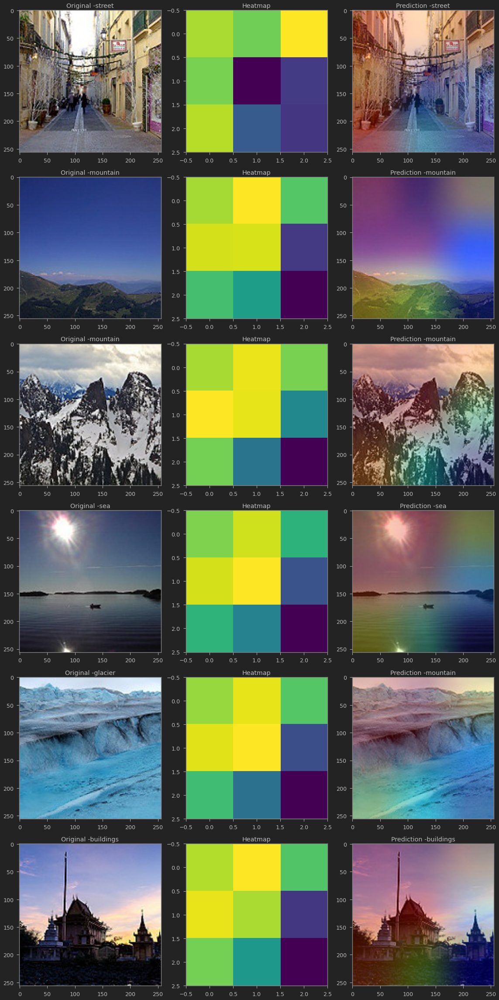

In [ ]:
# Visualize the images in the dataset
fig, axs = plt.subplots(6,3, figsize = (16,32))
count = 0
for _ in range(6):
    i = random.randint(0, len(image))
    gradcam, heatmap = grad_cam(image[i])
    axs[count][0].title.set_text("Original -" + original[i])
    axs[count][0].imshow(image[i])
    axs[count][1].title.set_text("Heatmap") 
    axs[count][1].imshow(heatmap)
    axs[count][2].title.set_text("Prediction -" + prediction[i]) 
    axs[count][2].imshow(gradcam)  
    count += 1

fig.tight_layout()